# AIM: 
  This Project aim's to create statistical model that can predict the popularity of song based on various charasterstic features. 

# Overview: 
<p style='text-align: justify;'>  Given the Raw data set, we will first try to pre-process the data by handling the null values. Moving on, we will visualise the data points, both for categorical data points and for continuous data points. Sometimes, the presence of the number of unique values is significant to consider; we will try to understand the data distribution between the categorical values. To get the best out of our model, we will select the most significant and relevant features, followed by eliminating outliers. Finally, we will split our data for cross-validation. The next stage is preparing various models and drawing out the best hyperparameters that gives the lowest error. </p>

<a id='index'>  </a>
# Table Of Contents:

[Step 1:   Import Library's](#step_1)

[Step 2:   Load Data](#step_2)

[Step 3:   Handle Missing Values ](#step_3)

[Step 4:   Exploratory Data Analysis ](#step_4)

[Step 5:   Outlier Detection](#step_5)

[Step 6:   Corelation matrix ](#step_6)

[Step 7:   Feature Selection](#step_7)

[Step 8:   Dimentianality Reduction](#step_8)

[Step 9:   Split Data ](#step_9)

[Step 10:  Data Scaling](#step_10)

[Step 11:  Model Training and Analysis](#step_11)

[Step 12:  Save Model](#step_12)

[Step 13:  Generate Test Results ](#step_13)

[Step 14:  Conclusion](#step_14)

[Step 15:  References ](#step_15)

<a id='step_1'>  </a>

### STEP 1: Import Library's

#### Environment  and Set Up: 
<p style='text-align: justify;'> 
    We have used Python as our programming language to implement this statistical model. To ensure that we do not corrupt our python environment, we have tried to use Anaconda, which allows us to have a virtual python environment. Along with the Python language, we have installed third-party libraries like 'SkLearn', 'Numpy', 'Pandas', 'Jupyter Notebook', 'Matplotlib' and 'Seaborn.' using python package installer (i.e., pip )  
</p>
<p style='text-align: justify;'> 
    
<dl>
    <dt>Numpy:</dt>
      <dd>- This Framework allows us to handle multidimensional arrays and complex mathematical operations </dd>
    <dt>Pandas</dt>
      <dd>- Pandas framework helps us with handling the data tabular data. with this, we can also load the files of various formats </dd>
    <dt>Jupyter Notebook:</dt>
      <dd>- IDE used for development of of model </dd>
    <dt>Matplotlib and Seaborn </dt>
      <dd>- Framework for visualisation of the data.  We can plot various types of plots and draw our observations followed by their respective conclusions </dd>
    <dt>SkLearn </dt>
      <dd>- Sklearn provides us with various built in functions,that allows us to preprocess data points and build statistical machine learning models in an efficient manner </dd>
    
</dl>

</p>

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import pickle

from scipy import stats

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error , mean_absolute_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

from dtreeviz.trees import *
from IPython.core.display import display, HTML


[To The Table Of Contents](#index)

<a id='step_2'>  </a>

### STEP 2: Load the Data

<p style='text-align: justify;'> 
    For our regression task, we are provided with a data set in 'CSV' format. To load the data, we use a panda's built-in function "pandas.read_csv("file path") ". The loaded file will be in Pandas Data Frame. To have sneek peak of our data set, we use ".head()" function. By default, we will see the first 5 Rows of the file.  
</p>

In [2]:
# Load out trainig data set 

data = pd.read_csv("cs9856-spotify-regression-problem-2022/CS98XRegressionTrain.csv")
data.head()

,Id,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,1,My Happiness,Connie Francis,adult standards,1996,107,31,45,-8,13,28,150,75,3,44
1,2,Unchained Melody,The Teddy Bears,NaN,2011,114,44,53,-8,13,47,139,49,3,37
2,3,How Deep Is Your Love,Bee Gees,adult standards,1979,105,36,63,-9,13,67,245,11,3,77
3,4,Woman in Love,Barbra Streisand,adult standards,1980,170,28,47,-16,13,33,232,25,3,67
4,5,Goodbye Yellow Brick Road - Remastered 2014,Elton John,glam rock,1973,121,47,56,-8,15,40,193,45,3,63


<hr>

<p style='text-align: justify;'> 
The data repo consists of 7 datasets that refer to the most popular songs from the 1950s to 2010s with ten years intervals. Each dataset has 15 attributes such as top genre, year of song, beats per minute(bpm), energy of a song(nrgy), danceability(dnce), loudness(dB), liveness(live), the valence of the song(val), duration(dur), acoustics(acous), speechiness(spch) and popularity(pop) and each has the data records of 10 years. The attributes are collected from a selection of songs available in Spotify’s playlist.
 In order to carry out the machine learning tasks smoothly, the seven datasets are converted into two, named train dataset and test dataset. The training dataset has 15 attributes and trains the learning model. The test dataset has 14 attributes, and the target column is predicted by the model that the training dataset has already trained.
</p>

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 453 entries, 0 to 452
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Id         453 non-null    int64 
 1   title      453 non-null    object
 2   artist     453 non-null    object
 3   top genre  438 non-null    object
 4   year       453 non-null    int64 
 5   bpm        453 non-null    int64 
 6   nrgy       453 non-null    int64 
 7   dnce       453 non-null    int64 
 8   dB         453 non-null    int64 
 9   live       453 non-null    int64 
 10  val        453 non-null    int64 
 11  dur        453 non-null    int64 
 12  acous      453 non-null    int64 
 13  spch       453 non-null    int64 
 14  pop        453 non-null    int64 
dtypes: int64(12), object(3)
memory usage: 53.2+ KB


<hr>

<p style='text-align: justify;'> 
    To prevent biasness during training, we randomly shuffle the records (i.e., rows). Shuffling will ensure that our model is generalised and quickly reach the point of convergence.  Pandas data frame has a built-in function "DataFrame.sample()" and the argument it is essential to mention the number of records we need. Here we will pass the total number of records that are available in the data set.
</p>

In [4]:
# Shuffle the data rows

data = data.sample(n = data.shape[0])
data.head()

,Id,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
363,364,Hey Jude - Remastered 2009,The Beatles,british invasion,1973,145,55,40,-10,9,67,431,3,3,67
241,242,Stronger,Kanye West,chicago rap,2007,104,72,62,-8,41,49,312,1,15,80
46,47,Take Good Care Of My Baby - 1990 Remastered,Bobby Vee,adult standards,2011,82,43,49,-12,12,66,151,70,6,60
220,221,If I Give My Heart To You,The Teddy Bears,NaN,2011,113,29,49,-10,12,29,118,86,3,40
375,376,Listen to the Music,The Doobie Brothers,album rock,1972,106,60,65,-13,7,91,227,22,3,75


[To The Table Of Contents](#index)


<a id='step_3'>  </a>

### STEP 3: Handle Missing Values

<p style='text-align: justify;'> 
    It is improbable that all the data points are in place when collecting the data. There will be a high chance that some data points are missing. Some common reasons for missing data are undefined values, data collection errors, incorrect implementation of SQL Queries and many more. We must ensure that we handle our NaN values before processing them for modelling. NaN values are handled in many ways 1) Ignore the values or drop missing data points 2) Impute the NaN values with Mean, Median or Mode 3) More intuitive one will be to use the ML model like KNN to predict the data points. Since our data set is very small, we will eliminate the records with missing values. 
</p>
<p style='text-align: justify;'> 
    To get the missing values use the function ".isna()" ,which returns an array such that missing data points is labelled one. We will use the "sum()" function to add this up.  
</p>

In [5]:
# Amount of missing values 

data.isna().sum()   

Id            0
title         0
artist        0
top genre    15
year          0
bpm           0
nrgy          0
dnce          0
dB            0
live          0
val           0
dur           0
acous         0
spch          0
pop           0
dtype: int64

As wee see here only 3% of the data is missing; soo we will eliminate the data points by dropppng the records that has the missing values 

In [6]:
# drop the records that are having the null values! 

data.dropna(inplace= True, axis= 0)
data.reset_index(drop= True, inplace= True)

# see the amount of data that is missing 
np.round( data.isna().sum() / data.shape[0] *100 ) 


Id           0.0
title        0.0
artist       0.0
top genre    0.0
year         0.0
bpm          0.0
nrgy         0.0
dnce         0.0
dB           0.0
live         0.0
val          0.0
dur          0.0
acous        0.0
spch         0.0
pop          0.0
dtype: float64

[To The Table Of Contents](#index)

<a id='step_4'>  </a>

### STEP 4: Exploratory Data Analytics

<p style='text-align: justify;'> 
   EDA visualises the data to understand better the distribution of values with respect to other features. We can analyse patterns, anomalies and trends using different types of charts, ensuring a promising model. 
</p>
<p style='text-align: justify;'> 
   Visualise continuous <b> numerical data </b> to see if the data points have Gaussian distribution or not. The data points must not be tailed heavy, if so this leads to a biased model. Popular data transformation techniques are Logarithmic, Reciprocal, Square Root, Exponential and Box-Cox
</p>
<p style='text-align: justify;'> 
   For Categorical data points, there must be equal importance given to every categorical feature. Sometimes one class will have more data points belonging to one class. We can either eliminate additional data points or perform oversampling to generate synthetic data points to handle this imbalance. One of the most common methods to add synthetic data is Synthetic Minority Oversampling Technique in short (SMOT). In this data Set, we have only one or two data points belonging to a particular class, for example, 'g funk', 'pop' and others. Some data points are comparatively very high in numbers, for example, 'adult standards', 'blues rock' and others. Here we will not try creating synthetic data as the minimum number of data points needed is 3. For this regression task, we will eliminate the 'top_genre' feature. 
</p>

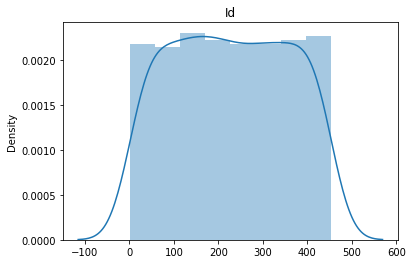

---------------------------------------------------------------------------------------------------------------------

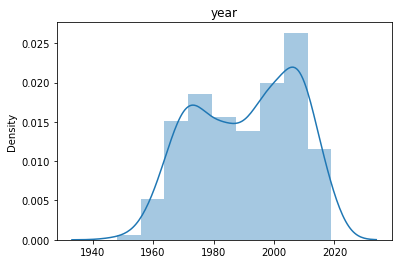

---------------------------------------------------------------------------------------------------------------------

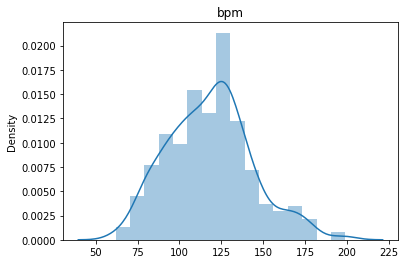

---------------------------------------------------------------------------------------------------------------------

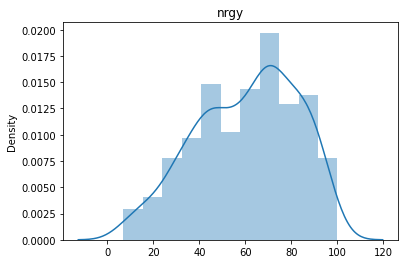

---------------------------------------------------------------------------------------------------------------------

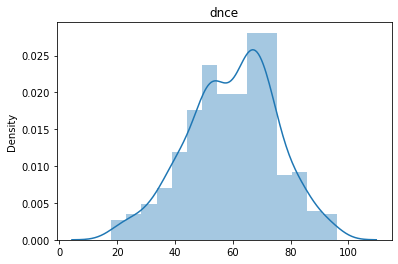

---------------------------------------------------------------------------------------------------------------------

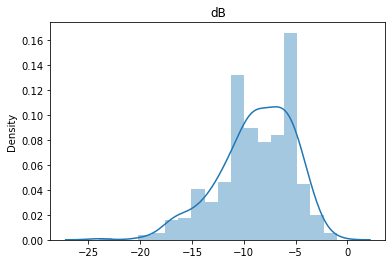

---------------------------------------------------------------------------------------------------------------------

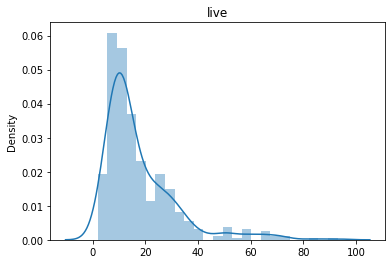

---------------------------------------------------------------------------------------------------------------------

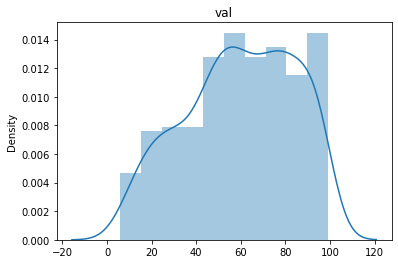

---------------------------------------------------------------------------------------------------------------------

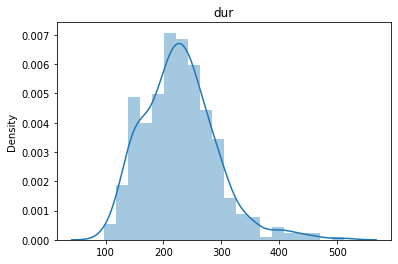

---------------------------------------------------------------------------------------------------------------------

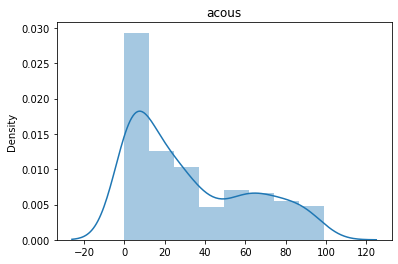

---------------------------------------------------------------------------------------------------------------------

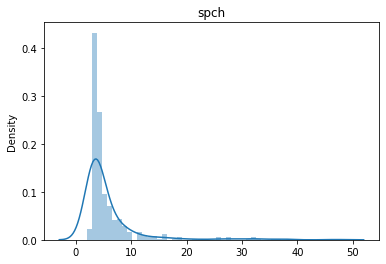

---------------------------------------------------------------------------------------------------------------------

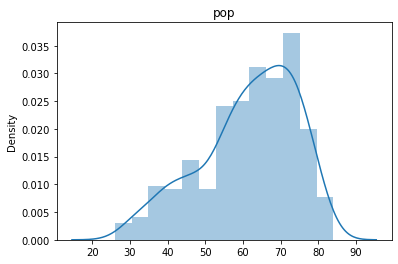

---------------------------------------------------------------------------------------------------------------------

In [7]:
# Plot the various numerical values/ Continious Values and there distrobution 

for i in data.select_dtypes(np.number):
    sns.distplot(data[i].values);
    plt.title(i);
    plt.show();
    
    
    # This for loop adds character to differentiate iterations
    for i in ['-']*117:
        print(i, end = "")

![Noraml Distribution](images/normal-distribution.jpeg) 

(Simplypsychology.org, 2022)

<p style='text-align: justify;'> 
    As we can see, features like 'live', 'acous', 'spch', 'dB' are not distributed Gaussianly. There are various ways to transform the data to a bell-shaped Gaussian distribution; some typical transformation techniques are log, exponential, Box-cox, and square root transformations. Here we have used simple logarithmic transformation. Every data point is individually transformed using a log function. The log transformation reduces or removes the skewness of our original data. The important caveat here is that the original data has to follow or approximately follow a log-normal distribution (Htoon, 2022). 
</p>

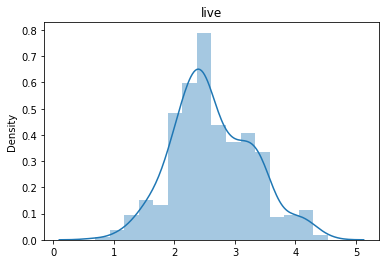

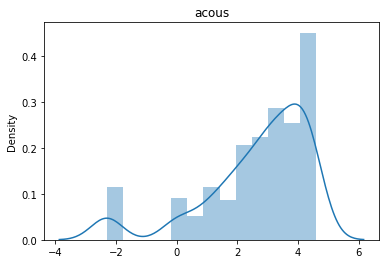

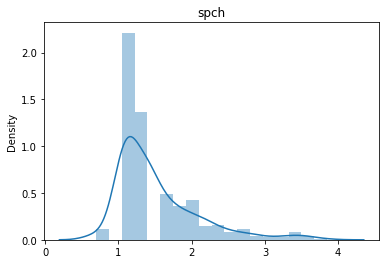

In [8]:
features_to_transform = ['live', 'acous', 'spch']


for d in features_to_transform:
    """
    * Iterate trough every feature present in the the list
    * Implement log transformation on every data point
    * Plot the distribution of every feature
    """
    data[d] = [ np.log(i+0.1) if i == 0 else np.log(i)  for i in data[d].values ]
    sns.distplot(data[d].values);
    plt.title(d);
    plt.show();



<p style='text-align: justify;'> 
Above we have transformed the numerical data to get a normal distribution. Now to handle <b>categorical data</b>, let us visualise the number of classes every data point belong to! There can be one of three outcomes for categorical features, 1) Every data point is <b>unique</b>; we do not have any common ground to interrelate values. 2) There is an <b>unequal</b> distribution of classes; here, we can create new synthetic data provided there are abundant data points 3) <b>Equal</b> Distribution of data points in the classes; this is an ideal condition where the number of data points belonging to a particular class is identical. For the data provided here, the song title is uniques to all; hence we drop that feature; similarly, the data points are imbalanced for "top genre" and the "artist". Adding synthetic data will lead to tremendous change in the data set, thus altering the output. We have decided to <b>drop</b> all the categorical features. 
</p>

In [9]:
# Lets see the number of unique values in the categorical features 

for i in data.select_dtypes(np.object0):
    print(f"The amount of the unique values in {i} are {data[i].nunique()/data.shape[0] *100 } % ")
    

The amount of the unique values in title are 99.54337899543378 % 
The amount of the unique values in artist are 75.57077625570776 % 
The amount of the unique values in top genre are 19.63470319634703 % 


<p style='text-align: justify;'> 
    As you can see here "ID" Column is just the numbers from 1 to the sape of the data frame, we will drop the column! 
Also we the "songs colum has all the unique vales! although the song is important but all the values are unique thus its better we will eliminate that feaature !
</p>

title has 436 features


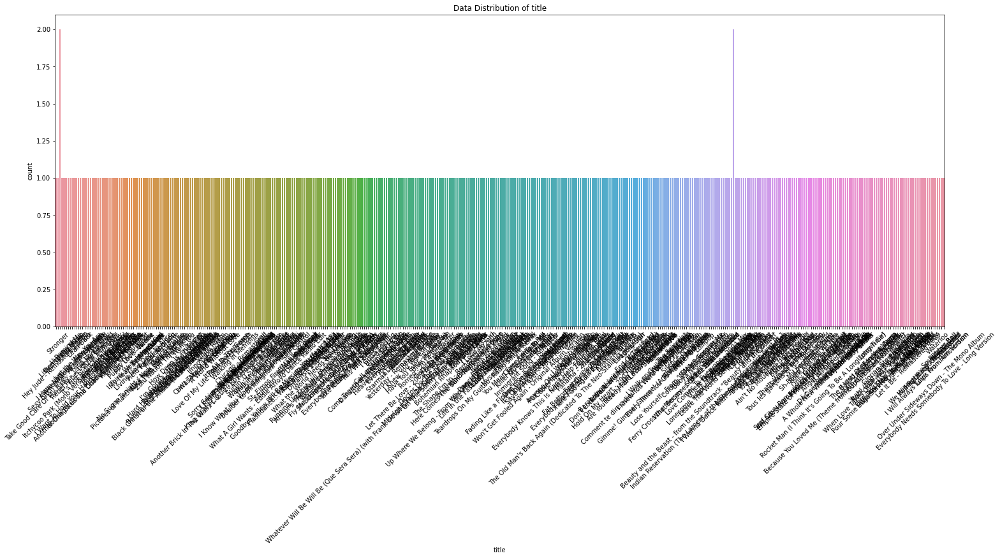

artist has 331 features


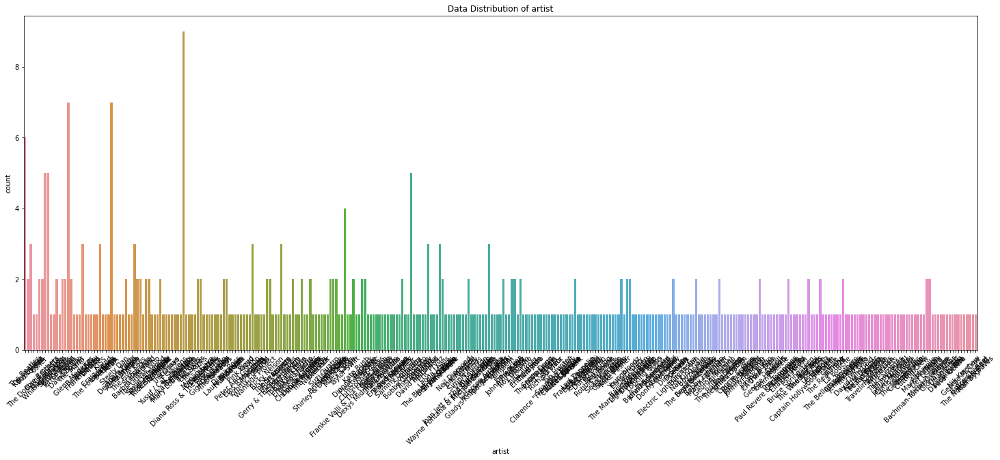

top genre has 86 features


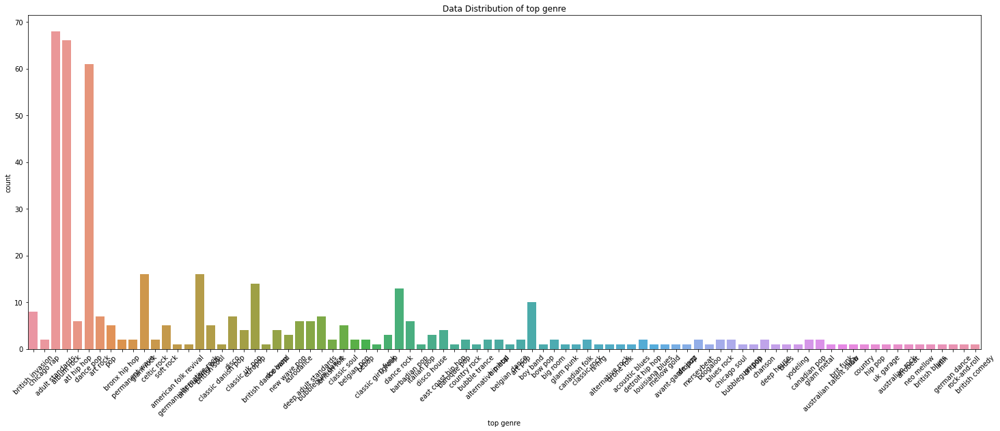

In [10]:
"""
• for loop iterates over all the categorical features
• using seaborns countplot function we visualise the distribution of data points 
"""

for i in data.select_dtypes(np.object0):
    print(f"{i} has {data[i].nunique()} features")
    plt.figure(figsize=(25,9))
    sns.countplot(data[i])
    plt.xticks(rotation= 45 )
    plt.title(f"Data Distribution of {i}")
    plt.show()
    
    

[To The Table Of Contents](#index)

In [11]:
# Removing all the categorical values 

data.drop(['Id','title', 'year', 'top genre','artist' ], axis= 1, inplace= True)
data.head()

,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,145,55,40,-10,2.197225,67,431,1.098612,1.098612,67
1,104,72,62,-8,3.713572,49,312,0.000000,2.708050,80
2,82,43,49,-12,2.484907,66,151,4.248495,1.791759,60
3,106,60,65,-13,1.945910,91,227,3.091042,1.098612,75
4,79,34,37,-13,2.302585,45,187,4.304065,1.098612,69


<a id='step_5'>  </a>

### STEP 5: Outlier Detection

<p style='text-align: justify;'> A value that is significantly different from the rest of the values in dataset is referred to as an <b>outlier</b>, also known as an extreme value.
The presence of outliers in the dataset greatly affect the mean of each variable(column) in the dataset which inturn affevts the standard deviation.
A boxplot is used to visually display outliers and interquartile range (IQR).

As indicated in the image below, an outlier is a data point in a dataset that is either below 1.5 IQRs of the first quartile (Q1) or above 1.5 IQRs of the third quartile (Q3).

Removal of outliers using IQR method involves calculation of 1st and 3rd quartiles which is named as Q1 and Q3.
Compute the difference between 3rd and 1st quartile 
The lower bound is calculated as (Q1–1.5*IQR) and upper bound is calculated as (Q3+1.5*IQR)

The values which falls below the lower bound and above the upper bound and marked as outliers which are then removed from the dataframe.
    </p>

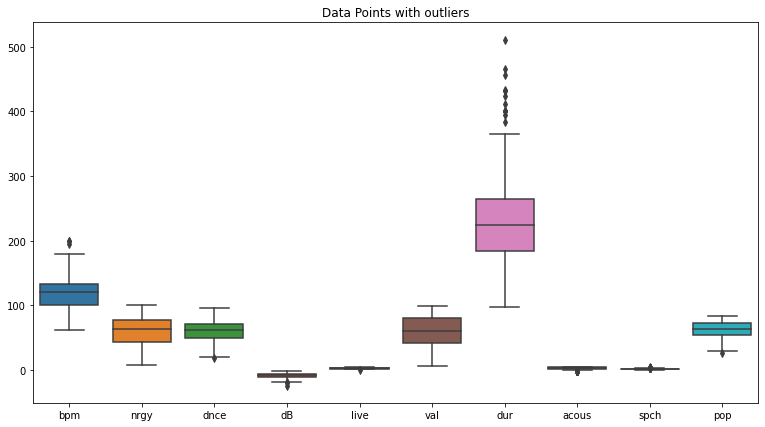

In [12]:
# Visualise the outliers using box plot

plt.figure(figsize=(13,7))
plt.title("Data Points with outliers")
sns.boxplot(data = data)
plt.show()

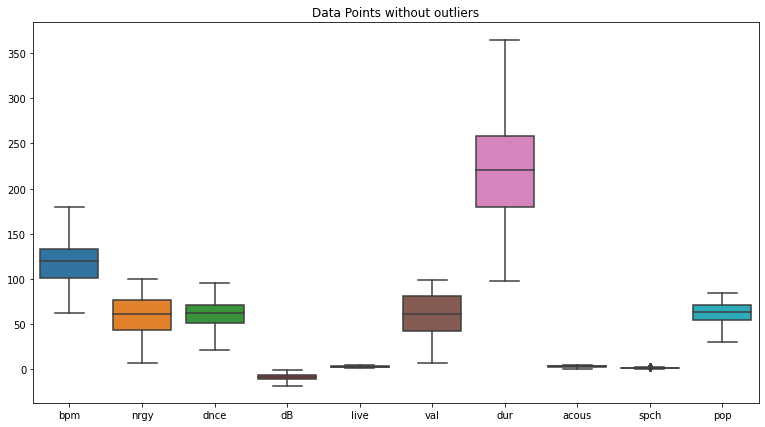

In [13]:
# Find the upper bound and lower bound for every feature 

Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3-Q1
lower_bound = (Q1-1.5*IQR)
upper_bound = (Q3+1.5*IQR)


data = data[~((data < lower_bound) | (data > upper_bound ) ).any(axis = 1)];

# Visualising the Data points after eliminating outliers 

plt.figure(figsize=(13,7))
plt.title("Data Points without outliers")
sns.boxplot(data = data)
plt.show()

[To The Table Of Contents](#index)


<a id='step_6'>  </a>

### STEP 6: corelation matrix 

<p style='text-align: justify;'> 
The correlation matrix represents the correlation between columns present in the given dataset. The value of correlation varies from -1 to +1 where positive value represent positive correlation between given columns,zero represents no correlation and negative value represent negative correlation.

DataFrame.corr() method is used to determine correlation between different columns.
The heat map reflecting the correlation matrix is created using the Seaborn heatmap() function.

The value of correlation is depicted by each square in the heatmap, which represents the value of correlation between the respective variables.
</p>

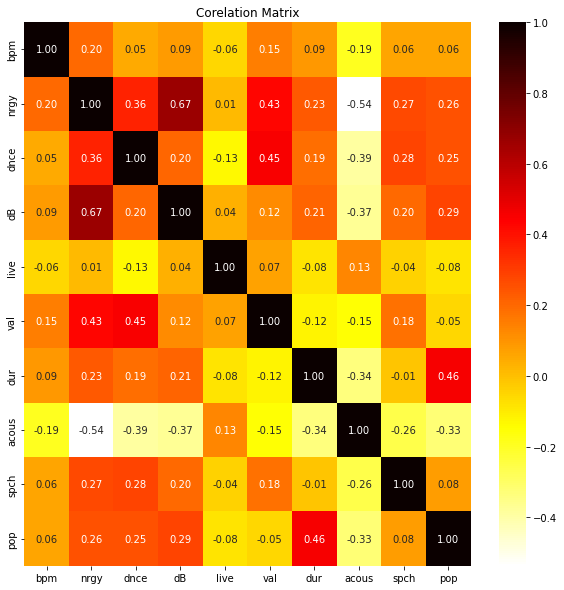

In [14]:
plt.figure(figsize=(10,10))
sns.heatmap(data.corr(), annot= True, fmt= '.2f', cmap= 'hot_r'  )
plt.title("Corelation Matrix")
plt.show()

<p style='text-align: justify;'>
As we see from the heatmap, 'dur', 'dB', 'dnce', 'acous' and 'nrgy' are the highly correlated features. To validate this we will run this through a tree-based algorithm and see the importance of every feature 
</p>

[To The Table Of Contents](#index)


<hr>

<a id='step_7'>  </a>

### STEP 7: Feature Selection

<p style='text-align: justify;'> Feature selection is the process which reduces the number of input variables to reduce computation involved,reduce training time and improve performance of developing predictive model.
The relationship between each statistical input variable and the output variable is evaluated, and the input variables with the strongest relation with the target variable are selected.
</p>

In [15]:
# analiseing the feature importance using randome forest

fe_imp = RandomForestRegressor(max_depth= 3 )
fe_imp.fit(data.iloc[:, :-1].values , data.iloc[:, -1].values)

for i, j in enumerate(fe_imp.feature_importances_):
    print(f"{i} :   {data.columns[i]}  has the { np.around(j , decimals= 2 ) } importance")

0 :   bpm  has the 0.01 importance
1 :   nrgy  has the 0.08 importance
2 :   dnce  has the 0.04 importance
3 :   dB  has the 0.06 importance
4 :   live  has the 0.02 importance
5 :   val  has the 0.02 importance
6 :   dur  has the 0.65 importance
7 :   acous  has the 0.09 importance
8 :   spch  has the 0.02 importance


[To The Table Of Contents](#index)

In [16]:
# Lets eliminate the features that are of less importance 

irrelevant_fea = [ i for i in data.columns if i not in ['dur', 'dB', 'dnce', 'acous', 'nrgy', 'pop' ] ]

data.drop(irrelevant_fea, axis= 1, inplace= True)
data.head()

,nrgy,dnce,dB,dur,acous,pop
1,72,62,-8,312,0.000000,80
2,43,49,-12,151,4.248495,60
3,60,65,-13,227,3.091042,75
4,34,37,-13,187,4.304065,69
5,63,66,-5,267,2.944439,73


<hr>

<a id='step_8'>  </a>

### STEP 8: Dimentianality Reduction 

<p style='text-align: justify;'>  Dimensionality reduction refers to techniques performed to reduce the number of dimensions or input variables in the feature set. Higher dimensionality may contain thousands or millions of variables as input which increases complexity of the model with high chances of overfitting which is referred as curse of dimensionality. Having fewer dimensions means less parameters which help to develop simple models especially for linear models. (Geron, 2019)
</p>

<hr>

<p style='text-align: justify;'>  The Principal Component Analysis (PCA) is a widely used technique for reducing the dimensionality of a dataset, which improves interpretability and reduces information loss. It finds the axis that retains the most variance or minimises the mean squared distance between the original dataset and the axis projection.

PCA aids in the discovery of significant features in a dataset by converting a large number of variables into a smaller set that includes the major portion of the information in the larger set. Smaller data sets are easier to examine and visualise, and machine learning algorithms can evaluate data much more readily and rapidly without having to deal with additional aspects, however this sacrifices accuracy for simplicity.
    
</p>

In [17]:
from sklearn.decomposition import PCA

pca = PCA(n_components= 2)

most_valued_data_points = pca.fit_transform(data.iloc[:, :-1].values)


DATA = pd.DataFrame(data = most_valued_data_points , columns = ['PC-1','PC-2'])

DATA['Target'] = data.iloc[:, -1].values


DATA.head()

,PC-1,PC-2,Target
0,91.691474,-1.293319,80
1,-72.069834,10.551147,60
2,6.109107,-1.037048,75
3,-38.039042,27.388973,69
4,46.299334,0.035241,73


[To The Table Of Contents](#index)


<a id='step_9'>  </a>

### STEP 9: Split data 

<p style='text-align: justify;'> 
    It is a common practice to <b>divide</b> the data between training and test. Test data gives us an insight into how well our model works on <b>unseen data</b> points. Here we can also understand if our model is overfitting or Underfitting. <b>Overfitting</b> is a condition where the model has learned all the training set data points, thus being less generic. <b>Overfitting</b> will make an awful prediction on new data points, making it useless for real-world applications. On the other hand, Underfitting is when the model fails to work on training data points. Underfitting occurs when a machine learning model is not complex enough to accurately capture relationships between a dataset's features and a target variable.
<p>

![Noraml Distribution](images/under_over.png) 

In [18]:
# SPLIT DATA

X_train, X_test, y_train, y_test = train_test_split( DATA.iloc[:, :-1].values, 
                                                    DATA.iloc[:, -1].values, 
                                                    test_size=0.20)

[To The Table Of Contents](#index)


<a id='step_10'>  </a>

### STEP 10: Data Scaling  

<p style='text-align: justify;'> Normalization is a scaling method that shifts and rescales data to make them range between 0 and 1 which is done by subtracting the value from min value and dividing by the max minus the min. Min-Max scaling is another name for it. Normalization is the process of converting the columns in a dataset to the same scale. When the ranges of features are different, it is just necessary.

Standardizing the feature values of the training and test sets by using the standard scaler function from the scikit learn library, which subtracts the mean value then divide by variance so the resultant has in unit variance and it does not bound values to particular range. It is useful when the scales of the individual features are different, standardizing the features helps to obtain standard normally distributed input values. The purpose for standardising variables is to improve the performance of algorithms. </p>

In [19]:
# DATA SCALING 

scalar = StandardScaler()

X_train = scalar.fit_transform(X_train)
X_test = scalar.fit_transform(X_test)

[To The Table Of Contents](#index)

<a id='step_11'>  </a>

### STEP 11: Model Training and Analysis 

<p style='text-align: justify;'> 
    Before we build a model, we have decided to define some helper functions for easy readability and reproducibility of similar types of results. The function "<b>regression_evaluation_report()</b> " returns different evaluation parameters. Running this helper function for evaluating the outputs of different regression models. We can compare the evaluation metrics for all the models and conclude which model is best for deployment. 
</p>
<p style='text-align: justify;'> 
Another helper function is " <b> plot_learning_curve() </b> ", which returns an error and the validation error at every iteration. As the model progresses to train, the error should decrease; this function will also help us analyse if our model is overfitting or underfitting. 
</p>

<hr>

#### Regression Evaluation Metrix
<p style='text-align: justify;'> 
<dl>
    <dt>RMSE:</dt>
      <dd>- Root Mean Square Error is the square root of the sum of all the predicted errors. Error is the difference between the actual value and predicted values. RMSE expresses how concentrated is data around the best model  </dd>
    <dt>MAE:</dt>
      <dd>- Mean Absolute Error is the average difference between the predicted and the actual values. We can determine the accuracy of our model </dd>
    <dt>r2_score:</dt>
      <dd>- R2 score is used to evaluate the performance of regression models. R2 score tells us by what percentage our model describes the new output variable. For example, if the r2 score is 0.8, 80% of the model parameters describe the new unknown parameter. </dd>
</dl>
</p>

In [20]:
def regression_evaluation_report(test , predict):
    """
    input: 
        test: actual values 
        predict: values predicted by the model 
    
    output: Generates a report based on various metrics  
    """

    print(f"Root Mean Square Error = { np.sqrt( mean_squared_error(test, predict) )} ")
    
    print(f"The mean absolute error = {mean_absolute_error(test, predict) }")

    print(f"The mean absolute percentage error = {mean_absolute_percentage_error(test, predict) }  ")

    print(f" r2_score = {r2_score(test, predict) }  ")

In [21]:
def plot_learning_curve(model, model_type):
    """
    input  : takess the object of the model
    output : plots the error at every training circle
    """
    train_error , test_error = [] , []

    for i in range(1 , len(X_train)):
        model.fit(X_train[:i] , y_train[:i])
        y_train_pred = model.predict(X_train[:i])
        y_test_pred  = model.predict(X_test)
        train_error.append(mean_squared_error(y_train[:i], y_train_pred))
        test_error.append(mean_squared_error(y_test_pred , y_test))
    
    plt.figure(figsize=(10,10))
    plt.plot(np.sqrt(train_error) , "r-+" , label = "Train" )
    plt.plot(np.sqrt(test_error) , "b-" , label = "Test" )
    plt.xlabel(" epochs ")
    plt.ylabel("RMSE")
    plt.title(model_type)
    plt.legend()
    plt.show()

### Simple Linear Regression 

<p style='text-align: justify;'> 
Linear regression is a statistical modelling technique aiming to fit the best line based on the equation " y = mx + c ". Here "m" is the slope, and "c" is the intercept. We will calculate the loss based on the predicted values, which is an average difference between the actual and predicted values. A model uses the value of "m" and "c" that gives the most negligible error. The optimisation algorithm usually used is "Gradient Descent." 
<p>

Root Mean Square Error = 11.830386019895892 
The mean absolute error = 10.072198526877536
The mean absolute percentage error = 0.19425706157327108  
 r2_score = 0.30039575632045057  


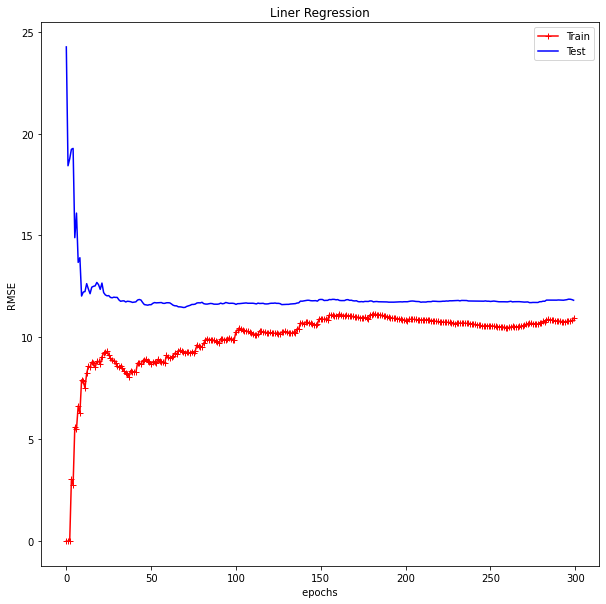

In [22]:
model_1 = LinearRegression() 
model_1.fit(X_train, y_train)
y_pred_1 = model_1.predict(X_test)

regression_evaluation_report(y_test, y_pred_1)
plot_learning_curve(model_1, "Liner Regression")

<p style='text-align: justify;'> 
We can observe here that we have an abysmal r2 score. Also, a pivotal point to consider is a significant error in the training data itself.<br>
We have plotted our data points and best-fit line to better understand this. It can be observed that most of the data points are far away from our model. <br> 
    To conclude model is under fitting. This can be becase our data set is not linearly separable
</p>

### Regularized Linear Regression (Elastic Net)

<p style='text-align: justify;'> 
    
</p>

Root Mean Square Error = 11.969578243096795 
The mean absolute error = 10.157018762896664
The mean absolute percentage error = 0.19691163250386579  
 r2_score = 0.2838363073849396  


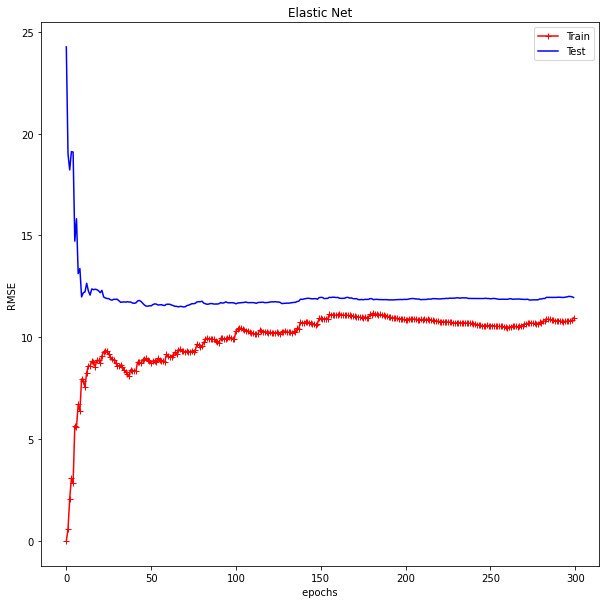

In [23]:
model_1_1 = ElasticNet(alpha= 0.2 , l1_ratio= 0.6)

model_1_1.fit(X_train, y_train)
y_pred_1_1 = model_1_1.predict(X_test);

regression_evaluation_report(y_test, y_pred_1_1)
plot_learning_curve(model_1_1, "Elastic Net")

<p style='text-align: justify;'> 
    
</p>

<p style='text-align: justify;'> 
    As we see from figure 1 and figure 2 for both regression and elastic net, there is a considerable error in our linear models. Let us try implementing <b>non-linear</b> models like Decision Tree and SVM to predict better.
    
</p>

<hr>

### Decission Tree 

<p style='text-align: justify;'> 
    Linear regression does the perfect job when it comes to finding the output of linearly separable data. But when the data is not linearly separable, we can use various other algorithms oneamong them is Decission Trees. 
</p>

<p style='text-align: justify;'> 
    Way decission tree works for regression is by assigning <b>threshold</b> points and then perform split. The output will be the mean of the values on either side of threshold. 
</p>

<p style='text-align: justify;'> 
    The most challenging part here is to find the threshold value, as we do not want every data point to be a threshold point, intern leading for a model to overfit
    
</p>

![Noraml Distribution](images/decisiontree.png) 

(Chiu, 2022)

<p style='text-align: justify;'>  
There are three major components in Decision Tree. The <b> root node </b> which is the original node it has arrows pointing outwords. <b> Intermediate node </b> that falls between root node and leaf node. <b> Leaf node </b> is a node whic canot be further devided into smaller nodes. 
</p>
<p style='text-align: justify;'>  
The algorithm the decision tree uses is "ID-3". According to this algorithm, our first step is to select a feature that would be a root none. There are various approaches like "squared error", "Friedman mse", "absolute error", "Poisson". While using sklearns built-in function, the default option is squared error. (2022)
</p>

Root Mean Square Error = 14.408056956548926 
The mean absolute error = 11.855263157894736
The mean absolute percentage error = 0.21175454440977082  
 r2_score = -0.03768475656140535  


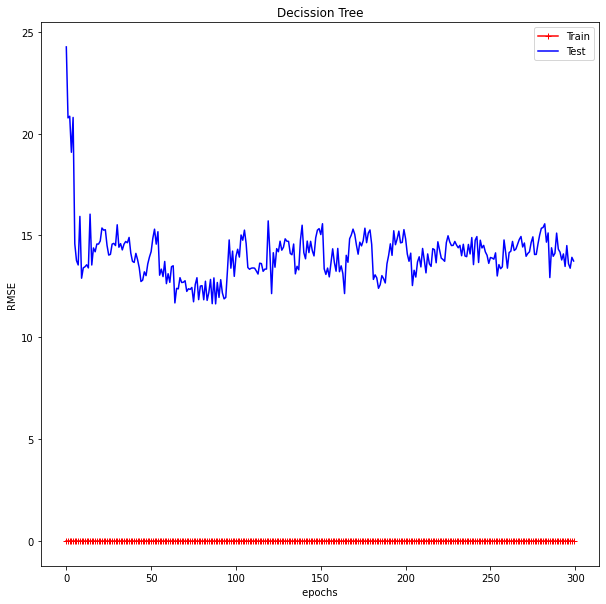

In [24]:
model_2 = DecisionTreeRegressor()
model_2.fit(X_train, y_train)
y_pred_2 = model_2.predict(X_test)

regression_evaluation_report(y_test, y_pred_2)
plot_learning_curve(model_2, "Decission Tree")

viz = dtreeviz(model_2, 
               X_train, 
               y_train, 
               target_name ='Target', 
               feature_names = [ DATA.columns[i] for i in range(0,  len(DATA.columns)-1 ) ] , 
               scale= 0.3)

# Visualise the decission tree 
viz

As we see here the decission tree has over-fitted, every data point has been learnt as a result the error of the test set is very high!! Now to over come this we try to do some hyper parameter tuning 

<p style='text-align: justify;'>  
    <b> Hyperparameter tuning: </b> The process of fine-tuning the statistical model by determining the right combination of arguments. We exploit various parameters that function as an argument to perform hyperparameter tuning. Sklearn provides two kinds of functions: Random Search CV and other Grid Search CV. We have selected Random Search CV to pick the values that fit the best randomly. As a result, it is less computationally expensive. (Geron, 2019)
<p>

Root Mean Square Error = 11.84320426743372 
The mean absolute error = 9.68726184805906
The mean absolute percentage error = 0.1844259253020898  
 r2_score = 0.2988788897330388  


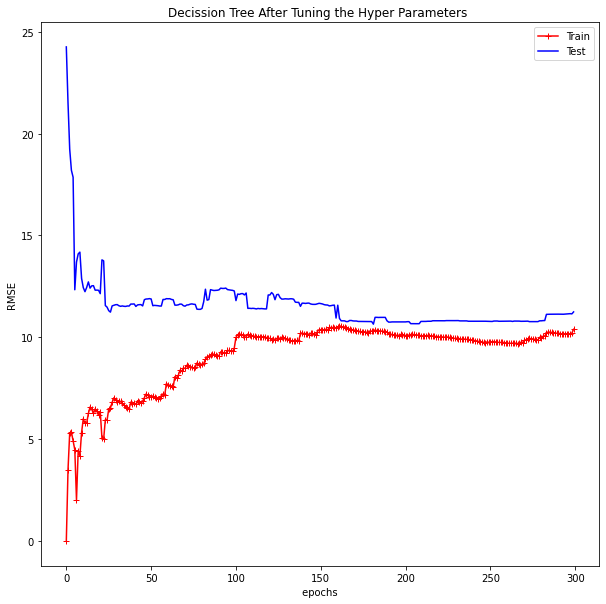

Decision Tree Structure


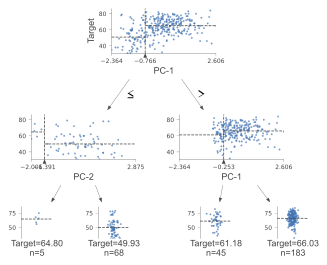

In [25]:
# Define our model 
model_2 = DecisionTreeRegressor( max_depth = 2 , min_samples_split = 6 ,
                                min_impurity_decrease = 0.01)

# Train models 
model_2.fit(X_train, y_train)

# Generate predictions 
y_pred_2 = model_2.predict(X_test)

regression_evaluation_report(y_test, y_pred_2)

plot_learning_curve(model_2, "Decission Tree After Tuning the Hyper Parameters ")

print("Decision Tree Structure")

# Plot the decission tree using dtreeviz function 
viz = dtreeviz(model_2 ,X_train, y_train, target_name='Target', feature_names= [ DATA.columns[i] for i in range(0,  len(DATA.columns)-1 ) ], scale= 1)

# Visualise the decission tree 
viz

[To The Table Of Contents](#index)


<p style='text-align: justify;'> 
    As we see from the above results, a Decision tree is less likely to overfit when the depth of the decision tree is less. To justify this, we observe from the above results the difference between the train error and test error is less 
</p>

<hr>

### Random forest 

<p style='text-align: justify;'> 
    <b>Ensemble methods</b> is a machine learning method that combines various weak learners to give output. "bagging", "stacking", and "boosting" are some of the ensemble methods. 

<b>Bagging</b> is a technique that evaluates homogenous weak learners in parallel and then combines them using a deterministic averaging strategy. Its main goal is to create an ensemble model with less variance than its members.

<b>Boosting</b>, which commonly considers homogeneous weak learners, learns them sequentially in a reasonably adaptative manner and then combines them using a deterministic method.

<b>Stacking</b>, which often takes into consideration diverse weak learners, learns them in parallel and then combines them by training a meta-model to generate a forecast based on the weak models' predictions.

Boosting and stacking have the purpose of producing strong models that are less biassed than their components. (Geron, 2019)
</p>

<p style='text-align: justify;'> 
    <b>Random forest</b> is an ensemble technique with multiple decision trees (i.e., week learners) and can be used for both Classification and Regression. Random forest, in most cases, outperforms traditional Decision trees
</p>

Root Mean Square Error = 11.281542389416906 
The mean absolute error = 9.040921052631578
The mean absolute percentage error = 0.17350216301623045  
 r2_score = 0.36380307899476183  


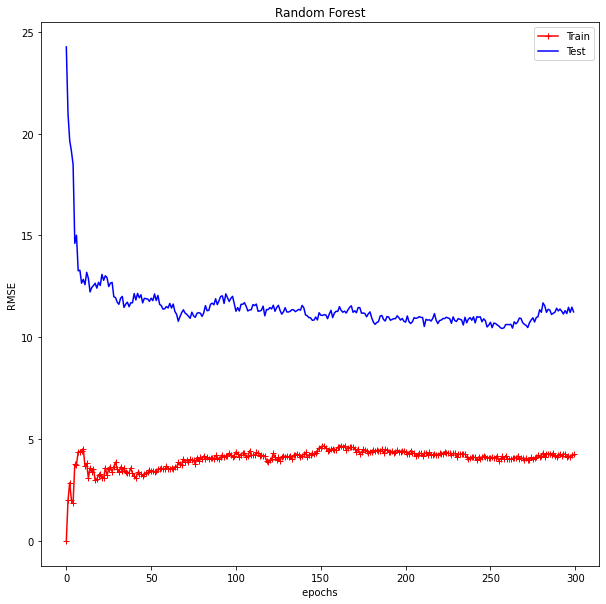

In [26]:
# Initialise model
model_3 = RandomForestRegressor()

# Train the model
model_3.fit(X_train, y_train)

# Generate predictions on validation data 
y_pred_3 = model_3.predict(X_test)

# Pass the arguments to helper function to generate report
regression_evaluation_report(y_test, y_pred_3)
plot_learning_curve(model_3, "Random Forest")

<br>

<p style='text-align: justify;'> 
    As we see above, using the ensemble method without tuning the hyperparameters is causing our model to overfit. i.e., Our model works fine with Training data but showcases a significant error for the unseen data set. It is essential to select an appropriate number of weak learners; we use the hyperparameter "n_estimators" to do this. <br>
    In the decision tree, one of the primary reasons for the model to overfit is the depth of the decision tree, "max_depth" is the hyperparameter that defines the depth of decision trees. Once we have all the hyperparameters in place, we added that as an argument to the object of "RandomForestRegressor()."  After all the hyperparameters have been defined, we train our random forest model, after which we can get the best parameters usings "best_params_" 
</p>

In [27]:
# Number of trees in random forest
n_estimators = [i for i in range (2, 1000, 25) ]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [i for i in range (2, 10, 2) ]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

model_3 = RandomForestRegressor()

rf_random = RandomizedSearchCV(estimator = RandomForestRegressor(), 
                               param_distributions = random_grid, 
                               n_iter = 100, 
                               cv = 3, 
                               verbose=2, 
                               random_state=42, 
                               n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=327; total time=   0.2s
[CV] END bootstrap=False, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=552; total time=   0.3s
[CV] END bootstrap=False, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=552; total time=   0.3s
[CV] END bootstrap=False, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=502; total time=   0.3s
[CV] END bootstrap=False, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=502; total time=   0.2s
[CV] END bootstrap=False, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=502; total time=   0.3s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=327; tota

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [2, 4, 6, 8],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [2, 27, 52, 77, 102,
                                                         127, 152, 177, 202,
                                                         227, 252, 277, 302,
                                                         327, 352, 377, 402,
                                                         427, 452, 477, 502,
                                                         527, 552, 577, 602,
                                                         627, 652, 677, 702,
      

In [28]:
# Look up of best parameters 

rf_random.best_params_

{'n_estimators': 27,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 2,
 'bootstrap': True}

Root Mean Square Error = 11.241526600612222 
The mean absolute error = 9.268224745081904
The mean absolute percentage error = 0.1763238542720149  
 r2_score = 0.36830827357715357  


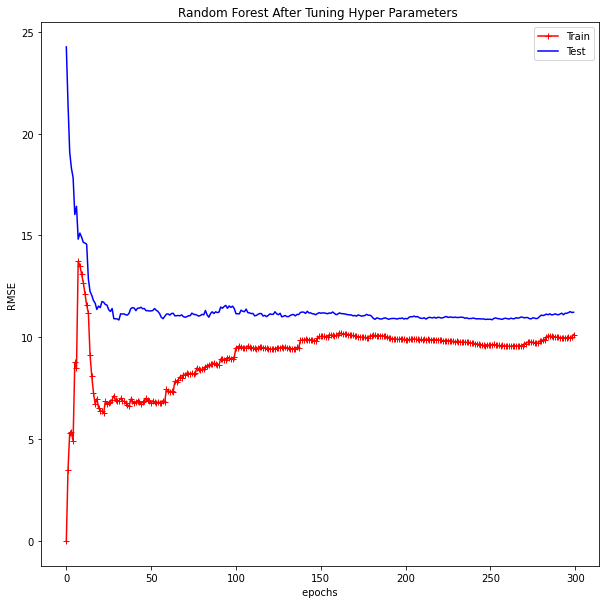

In [29]:
# Re-train the model using the best parameters 

model_3 = RandomForestRegressor(n_estimators =  527,
                                min_samples_split = 10, 
                                min_samples_leaf = 1, 
                                max_features = 'auto',
                                max_depth = 2, 
                                bootstrap = True)

# Training a model 
model_3.fit(X_train, y_train)

# Performing Prediction 
y_pred_3 = model_3.predict(X_test)

regression_evaluation_report(y_test, y_pred_3)

plot_learning_curve(model_3, "Random Forest After Tuning Hyper Parameters ")

### SVM for Regression

<p style='text-align: justify;'>  
    Support vector machine is a Machine learning algorithm used for regression, classification and outlier detection. There are two critical components used in SVM for regression. The " Hyperplane " acts as a decision boundary, and "Support Vectors." are at distance "+a" and "-a" from either side of the hyperplane. Here the goal of the model is to fit as many numbers data points with the decision boundary. (Sethi, 2022)
</p>

Root Mean Square Error = 11.333182286128277 
The mean absolute error = 9.50211581545217
The mean absolute percentage error = 0.1849688028960054  
 r2_score = 0.3579655201223243  


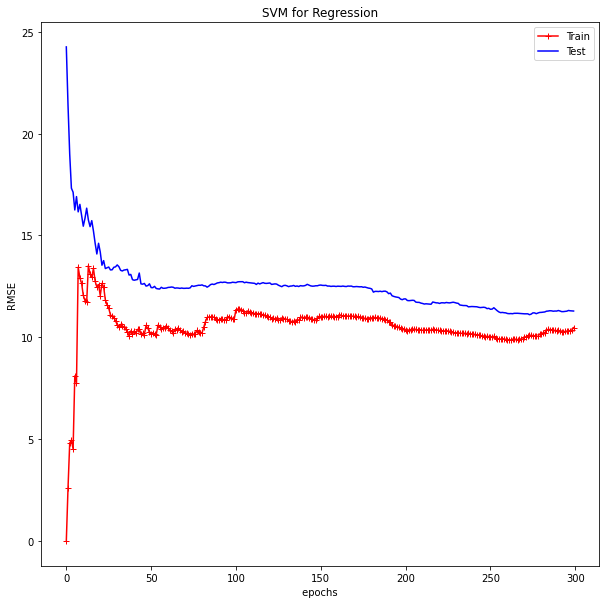

In [30]:
# Without Tuning hyper parameters 

model_4 = SVR()
model_4.fit(X_train, y_train)
y_pred_4 = model_4.predict(X_test)

regression_evaluation_report(y_test, y_pred_4)
plot_learning_curve(model_4, "SVM for Regression")

<p style='text-align: justify;'> 
    As we see, the SVM model is overfitting now; we will try hyperparameter tuning using. One of the strengths of SVM is that it has different types of  Kernels. Kernels make it computationally less expensive to find the hyperplane in higher dimensions. Hyperplane, as mentioned earlier, is a decision boundary.
</p>

In [31]:
#Tuning Hyper Parameters using Gaussian kernel 

# defining parameter range

param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
 
grid = RandomizedSearchCV(estimator = SVR(),
param_distributions = param_grid, 
n_iter = 100, 
cv = 3, 
verbose=2, 
random_state=42, 
n_jobs = -1)


 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ....................C=0.1, gamma=0.0001

RandomizedSearchCV(cv=3, estimator=SVR(), n_iter=100, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['rbf']},
                   random_state=42, verbose=2)

In [32]:
grid.best_params_

{'kernel': 'rbf', 'gamma': 0.01, 'C': 1000}

Root Mean Square Error = 10.691476503866735 
The mean absolute error = 8.901290162360073
The mean absolute percentage error = 0.17104884741276843  
 r2_score = 0.42861349956869665  


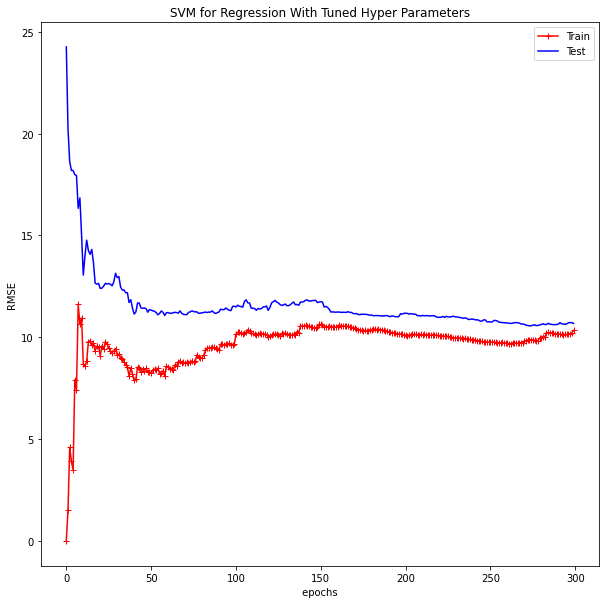

In [33]:
model_4_1 = SVR(C =10, gamma = 0.1,  kernel = 'rbf')
model_4_1.fit(X_train, y_train)
y_pred_4_1 = model_4_1.predict(X_test)

regression_evaluation_report(y_test, y_pred_4_1)
plot_learning_curve(model_4_1, "SVM for Regression With Tuned Hyper Parameters")

In [34]:
#Tuning Hyper Parameters using Polynomial Kernel

# defining parameter range

param_grid = {'C': [0.1, 1, 10, 100, 20,5], 
            'degree': [3,5,2] , 
            'coef0' : [0.01 ,  0.2, 0.8],
            'kernel': ['poly']}
 
grid = RandomizedSearchCV(estimator = SVR(),
                               param_distributions = param_grid, 
                               n_iter = 100, 
                               cv = 3, 
                               verbose=2, 
                               random_state=42, 
                               n_jobs = -1)


 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
[CV] END ...........C=0.1, coef0=0.01, degree=3, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=3, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=3, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=5, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=5, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=5, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=2, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=2, kernel=poly; total time=   0.0s
[CV] END ...........C=0.1, coef0=0.01, degree=2, kernel=poly; total time=   0.0s
[CV] END ............C=0.1, coef0=0.2, degree=3, kernel=poly; total time=   0.0s
[CV] END ............C=0.1, coef0=0.2, degree=3, kernel=poly; total time=   0.0s
[CV] END ............C=0.1, coef0=0.2, degree=3

RandomizedSearchCV(cv=3, estimator=SVR(), n_iter=100, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 20, 5],
                                        'coef0': [0.01, 0.2, 0.8],
                                        'degree': [3, 5, 2],
                                        'kernel': ['poly']},
                   random_state=42, verbose=2)

In [35]:
grid.best_params_

{'kernel': 'poly', 'degree': 3, 'coef0': 0.8, 'C': 1}

Root Mean Square Error = 10.885336132963724 
The mean absolute error = 8.987620003847459
The mean absolute percentage error = 0.1725533396358203  
 r2_score = 0.40770469171138735  


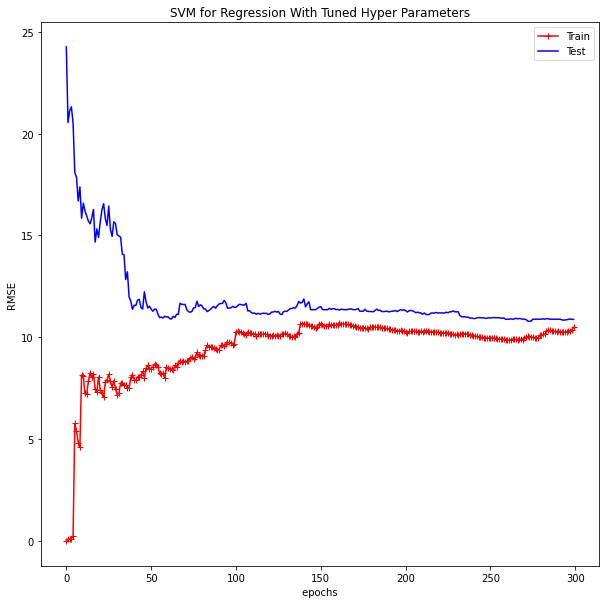

In [36]:
model_4_2 = SVR( kernel = 'poly', degree = 2, coef0 = 0.8, C = 5)
model_4_2.fit(X_train, y_train)
y_pred_4_2 = model_4_2.predict(X_test)

regression_evaluation_report(y_test, y_pred_4_2)
plot_learning_curve(model_4_2, "SVM for Regression With Tuned Hyper Parameters")

<a id='step_12'>  </a>

### STEP 12: Save Model

<p style='text-align: justify;'> 
    It is practically not possible to train our model every time. So we can save our models and use them for deployment on the web. One can save a Machine Learning model in one of two ways. One is by saving it as a pickle file, and the other is joblib. Here we have saved our best performing model as a pickle file. (Geron, 2019)
</p>

In [37]:
if False: 
    Pkl_Filename = "best__model.pkl"  

    with open(Pkl_Filename, 'wb') as file:  
        pickle.dump(model_4_1, file) 

if False:
    # Load the Model back from file
    with open('best_model.pkl', 'rb') as file:  
        model = pickle.load(file)

[To The Table Of Contents](#index)

<a id='step_13'>  </a>

### STEP 13: Generate Test Results 

<p style='text-align: justify;'> 
    For our test data set to be compatible with our model to perform prediction, we must perform similar pre-processing of data as it was done with the training data set. 
    
</p>

In [38]:
# Load the test data points 

df = pd.read_csv("cs9856-spotify-regression-problem-2022/CS98XRegressionTest.csv")
df.head()

,Id,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch
0,454,Pump It,The Black Eyed Peas,dance pop,2005,154,93,65,-3,75,74,213,1,18
1,455,"Circle of Life - From ""The Lion King""/Soundtra...",Elton John,glam rock,1994,161,39,30,-15,11,14,292,26,3
2,456,We Are The Champions - Remastered 2011,Queen,glam rock,1977,64,46,27,-7,12,18,179,38,3
3,457,Insomnia - Radio Edit,Faithless,big beat,2010,127,92,71,-9,37,53,216,6,4
4,458,This Eve of Parting,John Hartford,appalachian folk,2018,115,46,56,-12,21,34,153,18,3


In [39]:
# Keeping id names aside

Id = df.iloc[:, 0].values

In [40]:
features_to_transform = ['live', 'acous', 'spch' ]

for d in features_to_transform:
    df[d] = [ np.log(i+0.1) if i == 0 else np.log(i)  for i in df[d].values ]

In [41]:
# Removing all the categorical values 

df.drop(['Id','title', 'top genre', 'artist','year'	], axis= 1, inplace= True)
df.head()

# Drop irrelevant feaatures 

irrelevant_fea = [ i for i in df.columns if i not in ['dur', 'dB', 'dnce', 'acous', 'nrgy', 'pop' ] ]

df.drop(irrelevant_fea, axis= 1, inplace= True)


As we see here from the analysis, the model that gives the best result (i.e., least RMSE ) with test data is 
tuned Randome forest ! 


In [42]:
"""
Lets try to scale and transform the data based on, how that data points are trained 
"""

# Reduce the dimentions of the data points so that it is similar to how the data was trained 
Test = pca.transform(df.iloc[:,:].values)

# Scale the data 
Test = scalar.transform(Test)

# Store the results in the dataFrame
res = pd.DataFrame()
res['Id'] = Id

model = model_4_2 

res['pop'] = pd.DataFrame(  model.predict(Test)  )

# Save the csv file with name as "results" and file extention ".csv"
res.to_csv( 'results_L1.csv' , index = False)

[To The Table Of Contents](#index)

<a id='step_14'>  </a>

# Conclusion

<p style='text-align: justify;'> 
As we see here, we are not getting a perfect model. This R2 score and the RMSE of all the model is very poor. This is due to many reason 
<ol> 
    <li> Inadiquate data </li>
    <li> Model's are underfitting on the traing data   </li>
    <li> widely varying range between features </li>
    <li> Data Points do not show a predictable pattern </li>
</ol>
</p>

![DataComparison](images/comp.png) 

[To The Table Of Contents](#index)

<a id='step_15'>  </a>

# References



<ol>
  <li> Htoon, K., 2022. Log Transformation: Purpose and Interpretation. [online] Medium. Available at: <a href = https://medium.com/@kyawsawhtoon/log-transformation-purpose-and-interpretation-9444b4b049c9#:~:text=Log%20transformation%20is%20a%20data,with%20a%20log(x).&text=In%20other%20words%2C%20the%20log,follow%20a%20log%2Dnormal%20distribution.> link </a>[Accessed 15 February 2022]. </li>
  <li>Simplypsychology.org. 2022. [online] Available at: <a href= https://www.simplypsychology.org/normal-distribution.jpg> link </a>[Accessed 15 February 2022].</li>
  <li>Chiu, M., 2022. [online] Available at: <a  href= https://www.researchgate.net/figure/Basic-structure-of-a-decision-tree-All-decision-trees-are-built-through-recursion_fig3_295860754>link</a> [Accessed 18 February 2022].</li>
    <li>Simplypsychology.org. 2022. [online] Available at: <a href = https://www.simplypsychology.org/normal-distribution.jpg> link </a> [Accessed 15 February 2022].</li>
    <li>Sethi, A., 2022. Support Vector Regression In Machine Learning. [online] Analytics Vidhya. Available at: <a href = https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning> link </a> [Accessed 19 February 2022]</li>
    <li> Geron, A., 2019. Hands-On Machine Learning with Scikit-Learn and TensorFlow. 2nd ed. oreilly, pp.215-230. </li>
    <li> Geron, A., 2019. Hands-On Machine Learning with Scikit-Learn and TensorFlow. 2nd ed. oreilly, pp.79-81. </li>
    <li> Geron, A., 2019. Hands-On Machine Learning with Scikit-Learn and TensorFlow. 2nd ed. oreilly, pp.191-199. </li>
    <li> Geron, A., 2019. Hands-On Machine Learning with Scikit-Learn and TensorFlow. 2nd ed. oreilly, pp.77-79. </li>
    
</ol> 

[To The Table Of Contents](#index)